# Methodological Foundation of a Numerical Taxonomy of Urban Form

## Reproducible Python code used to produce figures

Code to create figures used in the manuscript. All data are obtained using the `morphometric_assessment.ipynb` notebook.

`<AUTHOR DETAILS REDACTED FOR PEER-REVEIW>`

The reproducible computational environment can be created using Docker container `darribas/gds_py:5.0`. We also need additional PyPI library `husl` to manage colors (`pip install husl`) and `matplotlib_scalebar` (`pip install matplotlib-scalebar`). 

In [1]:
!pip install husl

  Created wheel for husl: filename=husl-4.0.3-py3-none-any.whl size=3515 sha256=e83bdfd34b91305c53ea00daa5435839b57d4b35033efef8a43b3cd7f53f9fb3
  Stored in directory: /root/.cache/pip/wheels/f4/8d/27/0489d1d151f6e32fd879e165c4da1f2de95013d2afd4632366
Successfully built husl


In [2]:
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import husl
from random import shuffle
from legendgram import legendgram
import mapclassify
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.colors import ListedColormap
from matplotlib.collections import LineCollection
from shapely.geometry import Point

from tqdm import tqdm

## Plot Prague clusters
### Flat

In [3]:
clusters = pd.read_csv('prg_cluster_labels_10.csv', index_col=0)

In [4]:
gdf = gpd.read_file('geometry.gpkg',
                   layer='buildings')

/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:577: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


In [5]:
gdf = gdf.merge(clusters, on='uID', how='left')

In [6]:
gdf = gdf.dropna()
print(len(gdf.cluster.unique()))
gdf.shape

10


(140315, 3)

In [7]:
def north_arrow(f, ax, rotation=0, loc=2, legend_size=(.1,.1), frameon=False, thick=.1, outline=3, edgecolor='k', facecolor='k'):
    from legendgram.util import make_location
    from matplotlib.transforms import Affine2D
    
    arrpos = make_location(ax, loc, legend_size=legend_size)
    arrax = f.add_axes(arrpos)

    circle = plt.Circle((0, 0), radius=1, edgecolor=edgecolor, facecolor='w', linewidth=outline)
    arrax.add_patch(circle)

    rectangle = plt.Rectangle((-0.05, 0), thick, 1, facecolor=facecolor)
    t = Affine2D().rotate_deg(rotation) + arrax.transData
    rectangle.set_transform(t)
    arrax.add_patch(rectangle)
    arrax.axis('scaled')
    arrax.set_frame_on(frameon)
    arrax.get_yaxis().set_visible(False)
    arrax.get_xaxis().set_visible(False)
    return arrax

In [11]:
cols = []
colors = [(257, 71, 27), (98, 93, 78), (14, 79, 58), (26, 0, 50), (75, 90, 85), (347, 72, 60), (246, 79, 60)]

for col in colors:
    pal = sns.light_palette(col, input="husl", n_colors=4)
    for rgb in pal[1::2]:
        cols.append(rgb)

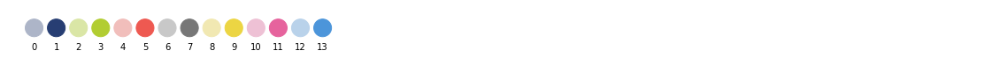

In [12]:
fig, ax = plt.subplots(figsize=(20, 5))
for i, c in enumerate(cols):
    ax.add_artist(plt.Circle((i, 0), 0.4, color=c))
    plt.text(i, -1, i, horizontalalignment='center')
    ax.set_axis_off()
    ax.set_aspect(1)
    ax.autoscale()
    plt.xlim(-1.25,43.25)
    plt.ylim(-1,1)

In [21]:
symbology = {0: cols[7],
             1: cols[11],
             2: cols[10],
             3: cols[9],
             4: cols[1],
             5: cols[0],
             6: cols[13],
             7: cols[5],
             8: cols[3],
             9: cols[4],
            }

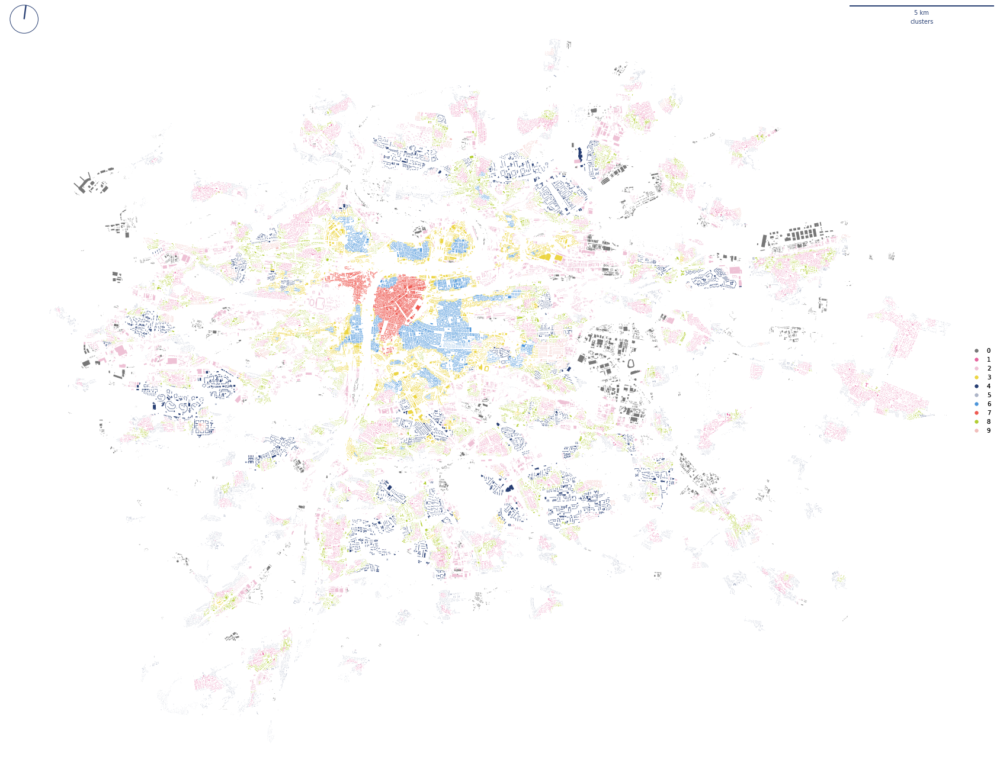

In [22]:
# settings
gdf = gdf
label = 'clusters'
color = (257, 71, 27)  # here for arrow, title, scalebar


# plotting
c = husl.husl_to_hex(*color)

ax = gdf.plot(color=gdf['cluster'].map(symbology), figsize=(30, 30))
ax.set_axis_off()


# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
                    label=label,
                    label_loc='bottom'
                    )
ax.add_artist(scalebar)

# add arrow
north_arrow(plt.gcf(), ax, -7.5, legend_size=(.04,.04), outline=1, edgecolor=c, facecolor=c)

# add manual legend
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=5, color=color) for color in symbology.values()]
leg_points = ax.legend(custom_points, symbology.keys(), loc='center right', frameon=False)
ax.add_artist(leg_points)
plt.savefig('./figs/PRG_clusters.png', bbox_inches='tight')

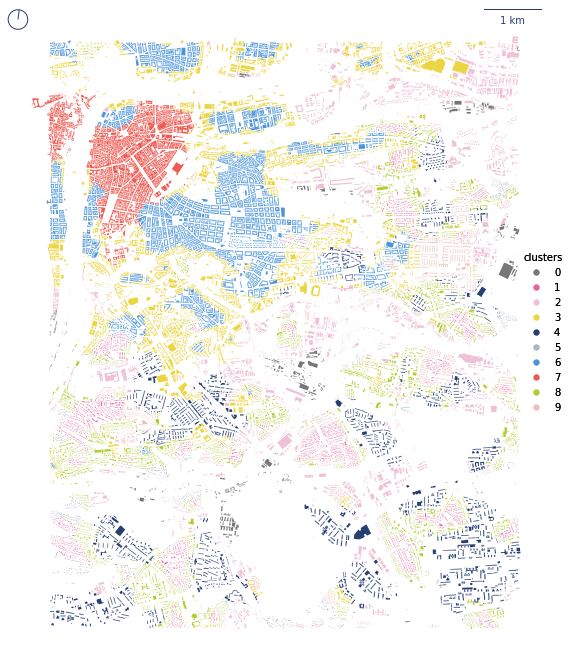

In [23]:
# settings
gdf_pl = gdf.cx[-744085:-736085, -1051465:-1041465]
label = 'clusters'
color = (257, 71, 27)  # here for arrow, title, scalebar


# plotting
c = husl.husl_to_hex(*color)

ax = gdf_pl.plot(color=gdf_pl['cluster'].map(symbology), figsize=(12, 12))
ax.set_axis_off()

# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
#                     label=label,
#                     label_loc='bottom'
                    )
ax.add_artist(scalebar)

# add arrow
north_arrow(plt.gcf(), ax, -7.5, legend_size=(.04,.04), outline=1, edgecolor=c, facecolor=c)

# add manual legend
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=5, color=color) for color in symbology.values()]
leg_points = ax.legend(custom_points, symbology.keys(), loc='center right', frameon=False, ncol=1, title="clusters", bbox_to_anchor=(1.05, .5))
ax.add_artist(leg_points)
plt.savefig('./figs/PRG_clusters_detail.png', bbox_inches='tight', dpi=300)

### Hierarchical

In [8]:
colors = [(257, 71, 27), (98, 93, 78), (14, 79, 58), (26, 0, 50), (75, 90, 85), (347, 72, 60), (246, 79, 60)]
cols = []
for col in colors:
    pal = sns.light_palette(col, input="husl", n_colors=7)
    for rgb in pal[2:]:
        cols.append(rgb)

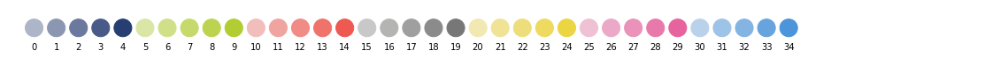

In [9]:
fig, ax = plt.subplots(figsize=(20, 5))
for i, c in enumerate(cols):
    ax.add_artist(plt.Circle((i, 0), 0.4, color=c))
    plt.text(i, -1, i, horizontalalignment='center')
    ax.set_axis_off()
    ax.set_aspect(1)
    ax.autoscale()
    plt.xlim(-1.25,43.25)
    plt.ylim(-1,1)

In [12]:
symbology = {0: cols[18],
             1: cols[14],
             2: cols[7],
             3: cols[0],
             4: cols[9],
             5: cols[34],
             6: cols[2],
             7: cols[4],
             8: cols[32],
             9: cols[10]}

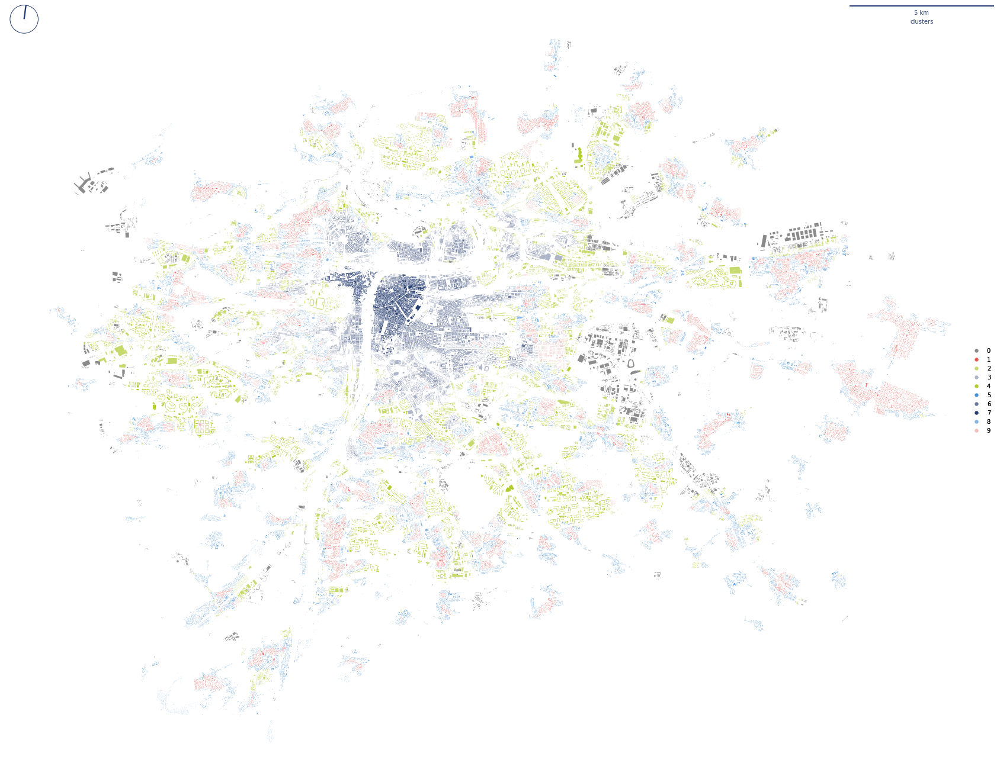

In [14]:
# settings
gdf = gdf
label = 'clusters'
color = (257, 71, 27)  # here for arrow, title, scalebar


# plotting
c = husl.husl_to_hex(*color)

ax = gdf.plot(color=gdf['cluster'].map(symbology), figsize=(30, 30))
ax.set_axis_off()


# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
                    label=label,
                    label_loc='bottom'
                    )
ax.add_artist(scalebar)

# add arrow
north_arrow(plt.gcf(), ax, -7.5, legend_size=(.04,.04), outline=1, edgecolor=c, facecolor=c)

# add manual legend
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=5, color=color) for color in symbology.values()]
leg_points = ax.legend(custom_points, symbology.keys(), loc='center right', frameon=False)
ax.add_artist(leg_points)
plt.savefig('./figs/PRG_hierarchical_clusters.png', bbox_inches='tight')

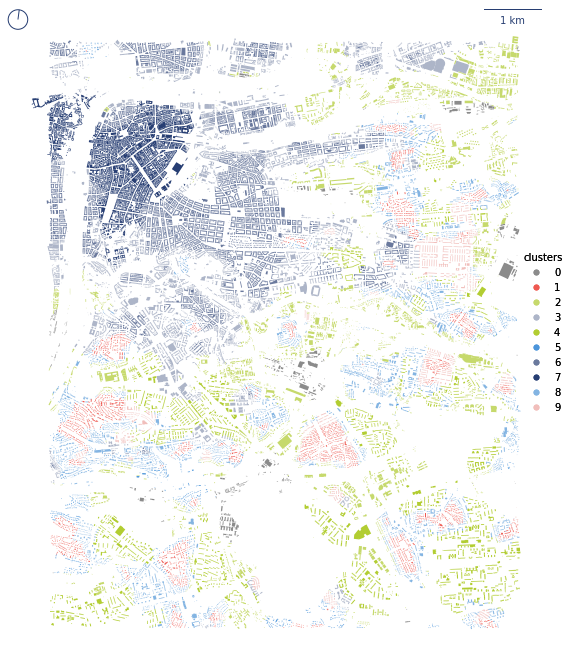

In [15]:
# settings
gdf_pl = gdf.cx[-744085:-736085, -1051465:-1041465]
label = 'clusters'
color = (257, 71, 27)  # here for arrow, title, scalebar


# plotting
c = husl.husl_to_hex(*color)

ax = gdf_pl.plot(color=gdf_pl['cluster'].map(symbology), figsize=(12, 12))
ax.set_axis_off()

# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
#                     label=label,
#                     label_loc='bottom'
                    )
ax.add_artist(scalebar)

# add arrow
north_arrow(plt.gcf(), ax, -7.5, legend_size=(.04,.04), outline=1, edgecolor=c, facecolor=c)

# add manual legend
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=5, color=color) for color in symbology.values()]
leg_points = ax.legend(custom_points, symbology.keys(), loc='center right', frameon=False, ncol=1, title="clusters", bbox_to_anchor=(1.05, .5))
ax.add_artist(leg_points)
plt.savefig('./figs/PRG_hierarchical_clusters_detail.png', bbox_inches='tight', dpi=300)

## Plot Amsterdam clusters

In [16]:
clusters = pd.read_csv('ams_cluster_labels_10.csv', index_col=0)

In [25]:
from download import download
download("https://www.dropbox.com/s/hav6e8ez4prno5u/geometry.gpkg?dl=1", "geometry_ams.gpkg")

Successfully downloaded file to geometry_ams.gpkg


'geometry_ams.gpkg'

In [17]:
gdf = gpd.read_file('geometry_ams.gpkg',
                   layer='buildings')

/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:577: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


In [18]:
gdf = gdf.merge(clusters, on='uID', how='left')
gdf.shape

(252385, 6)

In [19]:
gdf = gdf.dropna()
print(len(gdf.cluster.unique()))
gdf.shape

10


(252310, 6)

In [25]:
cols = []
colors = [(257, 71, 27), (98, 93, 78), (14, 79, 58), (26, 0, 50), (75, 90, 85), (347, 72, 60), (246, 79, 60)]

for col in colors:
    pal = sns.light_palette(col, input="husl", n_colors=4)
    for rgb in pal[1::2]:
        cols.append(rgb)

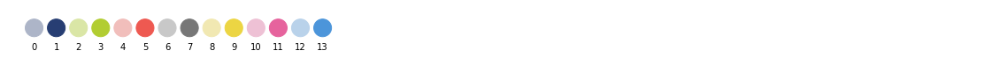

In [26]:
fig, ax = plt.subplots(figsize=(20, 5))
for i, c in enumerate(cols):
    ax.add_artist(plt.Circle((i, 0), 0.4, color=c))
    plt.text(i, -1, i, horizontalalignment='center')
    ax.set_axis_off()
    ax.set_aspect(1)
    ax.autoscale()
    plt.xlim(-1.25,43.25)
    plt.ylim(-1,1)

In [27]:
symbology = {0: cols[12],
             1: cols[13],
             2: cols[0],
             3: cols[4],
             4: cols[7],
             5: cols[9],
             6: cols[11],
             7: cols[5],
             8: cols[1],
             9: cols[3],
            }

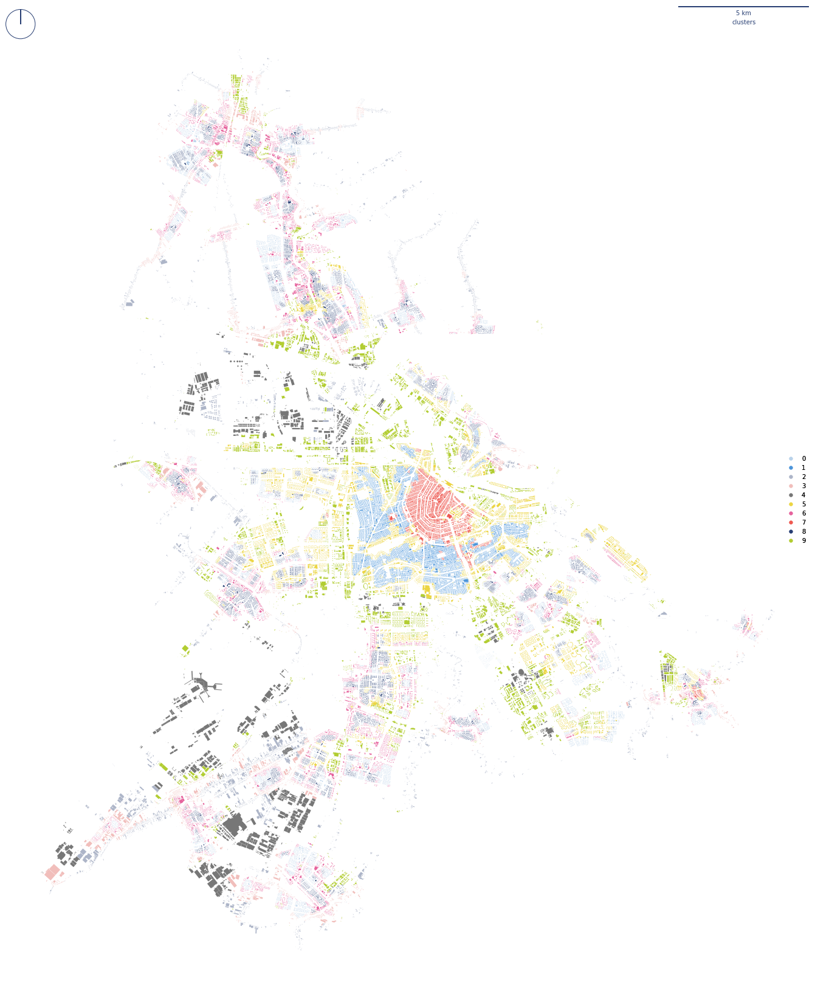

In [28]:
# settings
gdf = gdf
label = 'clusters'
color = (257, 71, 27)  # here for arrow, title, scalebar


# plotting
c = husl.husl_to_hex(*color)

ax = gdf.plot(color=gdf['cluster'].map(symbology), figsize=(30, 30))
ax.set_axis_off()


# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
                    label=label,
                    label_loc='bottom'
                    )
ax.add_artist(scalebar)

# add arrow
north_arrow(plt.gcf(), ax, 0, legend_size=(.04,.04), outline=1, edgecolor=c, facecolor=c)

# add manual legend
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=5, color=color) for color in symbology.values()]
leg_points = ax.legend(custom_points, symbology.keys(), loc='center right', frameon=False)
ax.add_artist(leg_points)
plt.savefig('./figs/AMS_clusters.png', bbox_inches='tight')

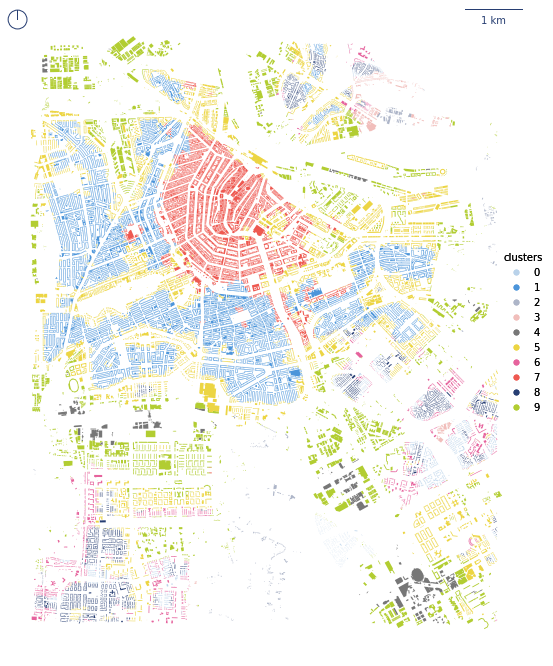

In [29]:
# settings
gdf_pl = gdf.cx[118000:126000, 480000:490000]
label = 'clusters'
color = (257, 71, 27)  # here for arrow, title, scalebar


# plotting
c = husl.husl_to_hex(*color)

ax = gdf_pl.plot(color=gdf_pl['cluster'].map(symbology), figsize=(12, 12))
ax.set_axis_off()


# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
#                     label=label,
#                     label_loc='bottom'
                    )
ax.add_artist(scalebar)

# add arrow
north_arrow(plt.gcf(), ax, 0, legend_size=(.04,.04), outline=1, edgecolor=c, facecolor=c)

# add manual legend
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=5, color=color) for color in symbology.values()]
leg_points = ax.legend(custom_points, symbology.keys(), loc='center right', frameon=False, ncol=1, title="clusters", bbox_to_anchor=(1.05, .5))
ax.add_artist(leg_points)
plt.savefig('./figs/AMS_clusters_detail.png', bbox_inches='tight', dpi=300)

### Hierachical

In [20]:
colors = [(257, 71, 27), (98, 93, 78), (14, 79, 58), (26, 0, 50), (75, 90, 85), (347, 72, 60), (246, 79, 60)]
cols = []
for col in colors:
    pal = sns.light_palette(col, input="husl", n_colors=7)
    for rgb in pal[2:]:
        cols.append(rgb)

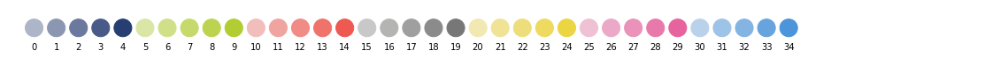

In [21]:
fig, ax = plt.subplots(figsize=(20, 5))
for i, c in enumerate(cols):
    ax.add_artist(plt.Circle((i, 0), 0.4, color=c))
    plt.text(i, -1, i, horizontalalignment='center')
    ax.set_axis_off()
    ax.set_aspect(1)
    ax.autoscale()
    plt.xlim(-1.25,43.25)
    plt.ylim(-1,1)

In [22]:
symbology = {0: cols[13],
             1: cols[1],
             2: cols[17],
             3: cols[33],
             4: cols[19],
             5: cols[31],
             6: cols[30],
             7: cols[3],
             8: cols[11],
             9: cols[8],
            }

# Prague
# symbology = {0: cols[18],
#              1: cols[14],
#              2: cols[7],
#              3: cols[0],
#              4: cols[9],
#              5: cols[34],
#              6: cols[2],
#              7: cols[4],
#              8: cols[32],
#              9: cols[10]}

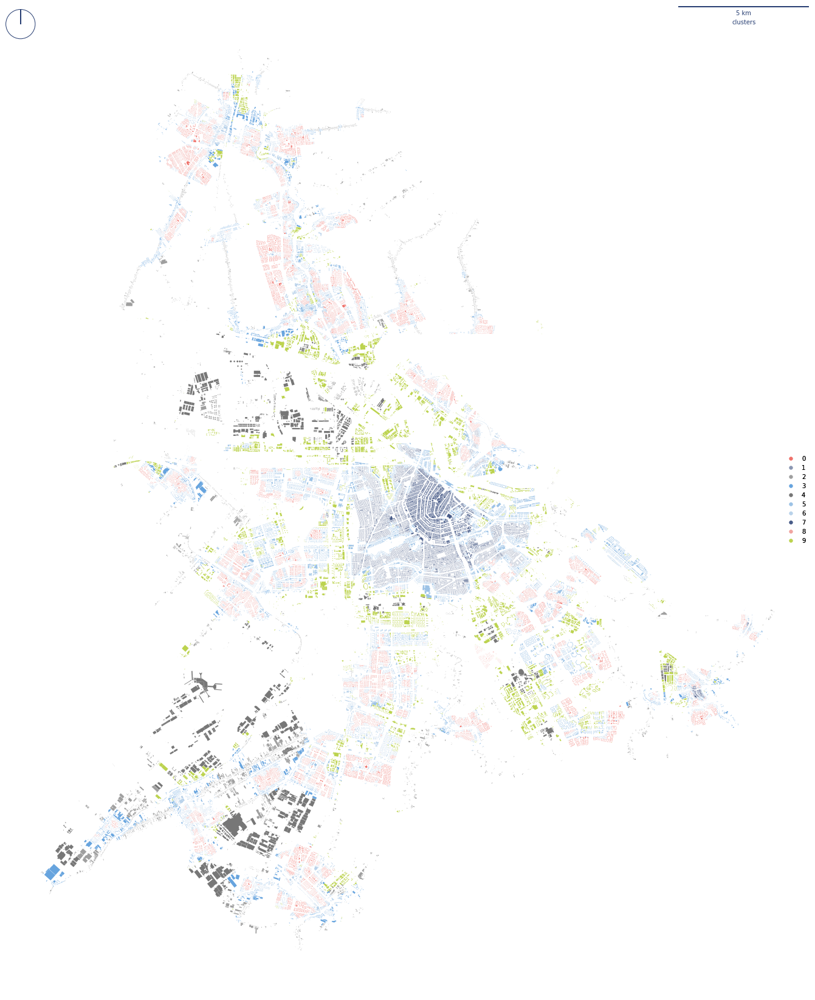

In [23]:
# settings
gdf = gdf
label = 'clusters'
color = (257, 71, 27)  # here for arrow, title, scalebar


# plotting
c = husl.husl_to_hex(*color)

ax = gdf.plot(color=gdf['cluster'].map(symbology), figsize=(30, 30))
ax.set_axis_off()


# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
                    label=label,
                    label_loc='bottom'
                    )
ax.add_artist(scalebar)

# add arrow
north_arrow(plt.gcf(), ax, 0, legend_size=(.04,.04), outline=1, edgecolor=c, facecolor=c)

# add manual legend
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=5, color=color) for color in symbology.values()]
leg_points = ax.legend(custom_points, symbology.keys(), loc='center right', frameon=False)
ax.add_artist(leg_points)
plt.savefig('./figs/AMS_clusters_hierarchical.png', bbox_inches='tight')

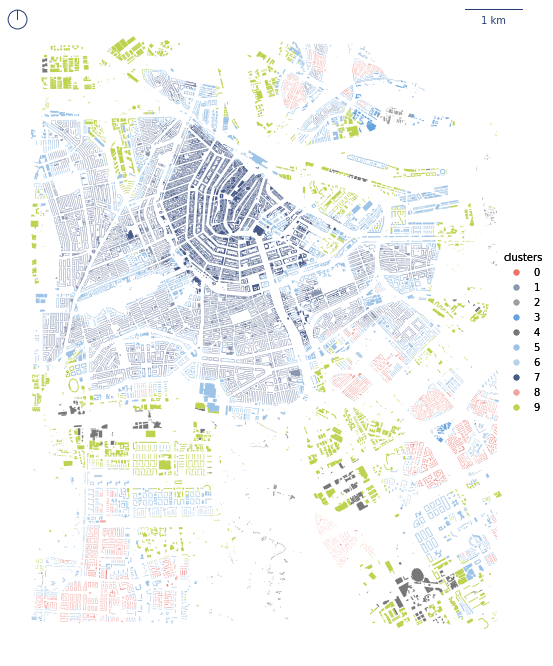

In [24]:
# settings
gdf_pl = gdf.cx[118000:126000, 480000:490000]
label = 'clusters'
color = (257, 71, 27)  # here for arrow, title, scalebar


# plotting
c = husl.husl_to_hex(*color)

ax = gdf_pl.plot(color=gdf_pl['cluster'].map(symbology), figsize=(12, 12))
ax.set_axis_off()


# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
#                     label=label,
#                     label_loc='bottom'
                    )
ax.add_artist(scalebar)

# add arrow
north_arrow(plt.gcf(), ax, 0, legend_size=(.04,.04), outline=1, edgecolor=c, facecolor=c)

# add manual legend
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=5, color=color) for color in symbology.values()]
leg_points = ax.legend(custom_points, symbology.keys(), loc='center right', frameon=False, ncol=1, title="clusters", bbox_to_anchor=(1.05, .5))
ax.add_artist(leg_points)
plt.savefig('./figs/AMS_clusters_detail_hierarchical.png', bbox_inches='tight', dpi=300)

## Plot combined maps

In [33]:
clustersAMS = pd.read_csv('files/200313_clusters_AMS+PRG_AMS.csv', index_col=0)
clustersPRG = pd.read_csv('files/200313_clusters_AMS+PRG_PRG.csv', index_col=0)

In [34]:
gdfAMS = gpd.read_file('files/geometry_ams.gpkg',
                   layer='buildings')
gdfAMS = gdfAMS.merge(clustersAMS, on='uID', how='left')
gdfAMS = gdfAMS.dropna()

In [35]:
gdfPRG = gpd.read_file('files/geometry.gpkg',
                   layer='buildings')
gdfPRG = gdfPRG.merge(clustersPRG, on='uID', how='left')
gdfPRG = gdfPRG.dropna()

In [36]:
cols = []
colors = [(257, 71, 27), (98, 93, 78), (14, 79, 58), (26, 0, 50), (75, 90, 85), (347, 72, 60), (246, 79, 60)]

for col in colors:
    pal = sns.light_palette(col, input="husl", n_colors=8)
    for rgb in pal[1:]:
        cols.append(rgb)

In [37]:
symbology = {'AMS_0': cols[1],
             'AMS_1': cols[41],
             'AMS_2': cols[43],
             'AMS_3': cols[26],
             'AMS_4': cols[2],
             'AMS_5': cols[32],
             'AMS_6': cols[34],
             'AMS_7': cols[38],
             'AMS_8': cols[11],
             'AMS_9': cols[19],
             'AMS_10': cols[46],
             'AMS_11': cols[3],
             'AMS_12': cols[47],
             'AMS_13': cols[4],
             'AMS_14': cols[48],
             'AMS_15': cols[27],
             'AMS_16': cols[8],
             'AMS_17': cols[13],
             'AMS_18': cols[0],
             'AMS_19': cols[36],
             'AMS_20': cols[37],
             'AMS_21': cols[9],
             'AMS_22': cols[45],
             'AMS_23': cols[25],
             'AMS_24': cols[20],
             'AMS_25': cols[11],
             'AMS_26': cols[10],
             'AMS_27': cols[33],
             'AMS_28': cols[40],
             'AMS_29': cols[5],
             'PRG_0': cols[19],
             'PRG_1': cols[27],
             'PRG_2': cols[46],
             'PRG_3': cols[18],
             'PRG_4': cols[12],
             'PRG_5': cols[3],
             'PRG_6': cols[48],
             'PRG_7': cols[13],
             'PRG_8': cols[20],
             'PRG_9': cols[39],
             'PRG_10': cols[1],
             'PRG_11': cols[6],
             'PRG_12': cols[44],
             'PRG_13': cols[40],
             'PRG_14': cols[43],
             'PRG_15': cols[4],
             'PRG_16': cols[34],
             'PRG_17': cols[41],
             'PRG_18': cols[32],
             'PRG_19': cols[10],
            }

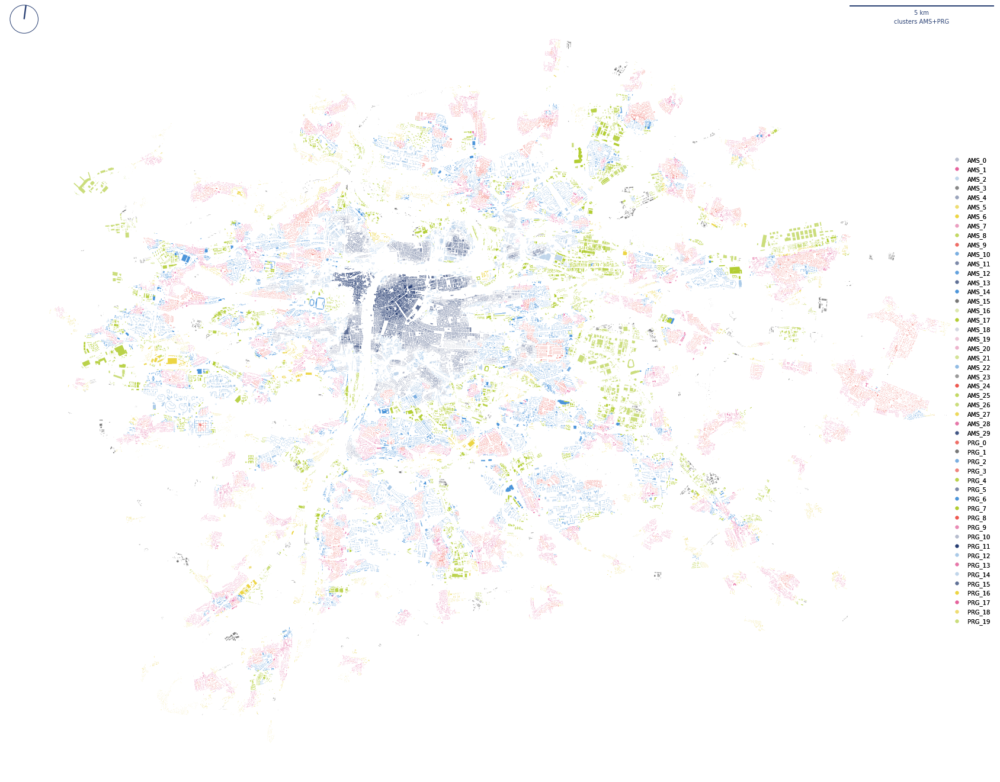

In [39]:
# settings
gdf = gdfPRG
label = 'clusters AMS+PRG'
color = (257, 71, 27)  # here for arrow, title, scalebar


# plotting
c = husl.husl_to_hex(*color)

ax = gdf.plot(color=gdf['cluster'].map(symbology), figsize=(30, 30))
ax.set_axis_off()


# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
                    label=label,
                    label_loc='bottom'
                    )
ax.add_artist(scalebar)

# add arrow
north_arrow(plt.gcf(), ax, -7.5, legend_size=(.04,.04), outline=1, edgecolor=c, facecolor=c)

# add manual legend
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=5, color=color) for color in symbology.values()]
leg_points = ax.legend(custom_points, symbology.keys(), loc='center right', frameon=False)
ax.add_artist(leg_points)
plt.savefig('../figs/AMSPRG_clusters_mixed_PRG.png', bbox_inches='tight')

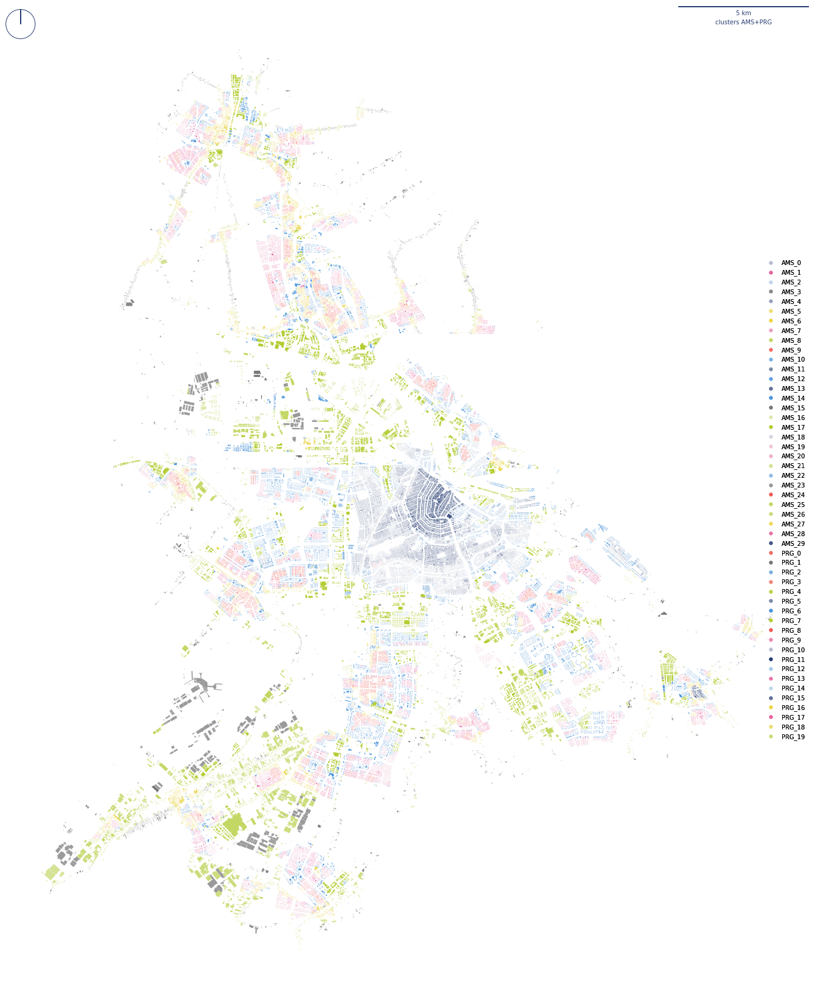

In [41]:
# settings
gdf = gdfAMS
label = 'clusters AMS+PRG'
color = (257, 71, 27)  # here for arrow, title, scalebar


# plotting
c = husl.husl_to_hex(*color)

ax = gdf.plot(color=gdf['cluster'].map(symbology), figsize=(30, 30))
ax.set_axis_off()


# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
                    label=label,
                    label_loc='bottom'
                    )
ax.add_artist(scalebar)

# add arrow
north_arrow(plt.gcf(), ax, 0, legend_size=(.04,.04), outline=1, edgecolor=c, facecolor=c)

# add manual legend
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=5, color=color) for color in symbology.values()]
leg_points = ax.legend(custom_points, symbology.keys(), loc='center right', frameon=False)
ax.add_artist(leg_points)
plt.savefig('../figs/AMSPRG_clusters_mixed_AMS.png', bbox_inches='tight')

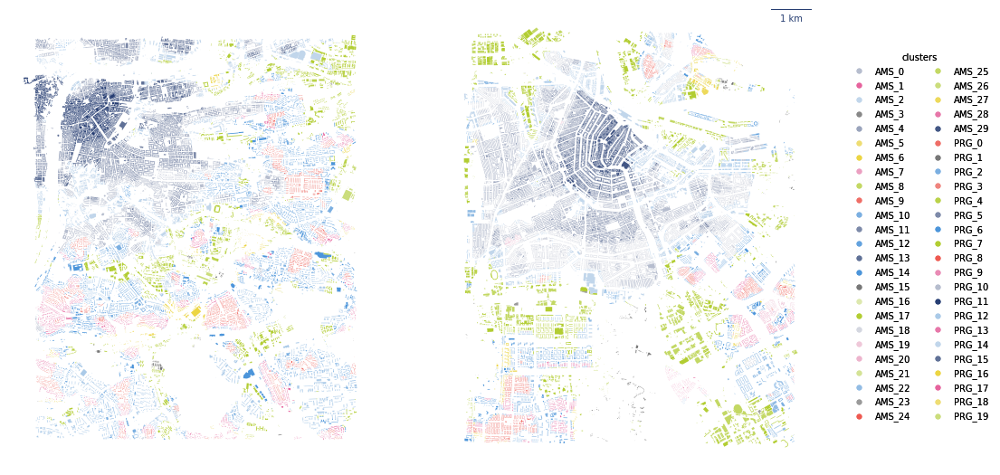

In [61]:
fig, axs = plt.subplots(1, 2, figsize=(16, 12))

label = 'clusters AMS+PRG'
color = (257, 71, 27)  # here for arrow, title, scalebar


# plotting
c = husl.husl_to_hex(*color)

gdfPRG.cx[-744085:-736085, -1051465:-1041465].plot(color=gdfPRG.cx[-744085:-736085, -1051465:-1041465]['cluster'].map(symbology), ax=axs[0])
axs[0].set_axis_off()

gdfAMS.cx[118000:126000, 480000:490000].plot(color=gdfAMS.cx[118000:126000, 480000:490000]['cluster'].map(symbology), figsize=(30, 30), ax=axs[1])
axs[1].set_axis_off()

# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
#                     label=label,
#                     label_loc='bottom'
                    )
axs[1].add_artist(scalebar)

# add manual legend
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=5, color=color) for color in symbology.values()]
leg_points = axs[1].legend(custom_points, symbology.keys(), loc='center right', frameon=False, ncol=2, title="clusters", bbox_to_anchor=(1.50, .5))
axs[1].add_artist(leg_points)


plt.savefig('../figs/AMSPRG_clusters_mixed_detail.png', bbox_inches='tight', dpi=300)

## Contiguity

In [175]:
sample = gdfPRG.iloc[gdfPRG.sindex.query(Point(-741550.84,-1044632.82).buffer(250))]

In [92]:
import momepy
from splot.libpysal import plot_spatial_weights
import libpysal

In [176]:
tess = momepy.Tessellation(sample.reset_index(drop=True), 'uID', Point(-741550.84,-1044632.82).buffer(250, 16, 16, 3)).tessellation

Inward offset...
Discretization...


 52%|█████▏    | 199/386 [00:00<00:00, 1984.42it/s]

Generating input point array...


100%|██████████| 386/386 [00:00<00:00, 1886.44it/s]


Generating Voronoi diagram...


Vertices to Polygons:   0%|          | 0/56645 [00:00<?, ?it/s]

Generating GeoDataFrame...


Vertices to Polygons: 100%|██████████| 56645/56645 [00:01<00:00, 30052.14it/s]


Dissolving Voronoi polygons...
Preparing limit for edge resolving...
Building R-tree...
Identifying edge cells...
Cutting...


In [177]:
W = libpysal.weights.Queen.from_dataframe(tess)

In [178]:
tgt = 341
k1 = W.neighbor_offsets[341]
k2 = []
for i in k1:
    k2 += W.neighbor_offsets[i]
k3 = []
for i in k2:
    k3 += W.neighbor_offsets[i]
neighbours = set(k1 + k2 + k3)

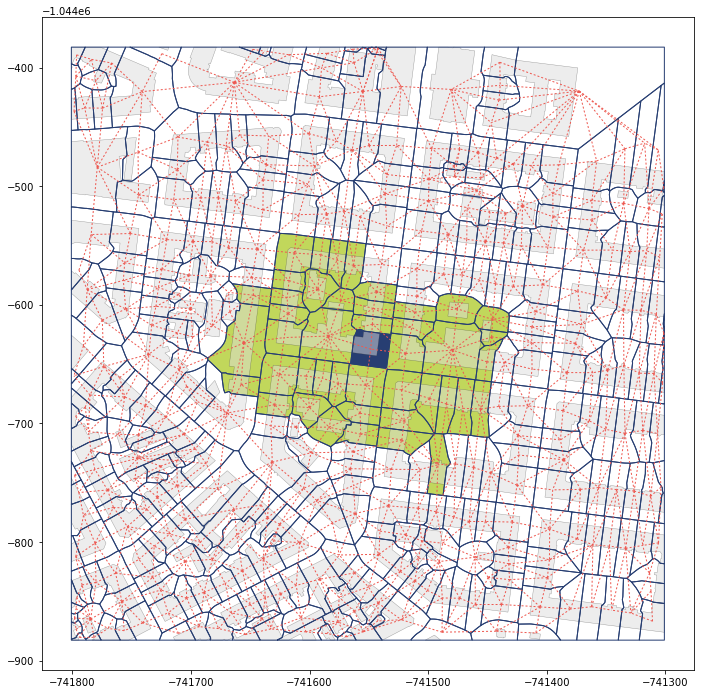

In [179]:
import numpy as np

centroids = tess.centroid.values
done = []
segments = []
for idx in W.id_order:
    if idx in W.islands:
        continue

    # Find the centroid of the polygon we're looking at now
    origin = np.array(centroids[idx].coords)[0]
    for j in W.neighbors[idx]:
        jdx = W.id2i[j]
        dest = np.array(centroids[jdx].coords)[0]
        if not hash((idx, j)) in done and not hash((j, idx)) in done:
            segments.append([origin, dest])
            done.append(hash((idx, j)))

# Plot the polygons from the geodataframe as a base layer
ax = tess.plot(figsize=(12, 12), edgecolor=c, facecolor='none', linewidth=1, zorder=1)

# # plot polygon centroids
gpd.clip(sample, Point(-741550.84,-1044632.82).buffer(250, 16, 16, 3)).plot(ax=ax, edgecolor='#333333', linewidth=.4, facecolor="#ddd", zorder=0, alpha=.5)

# plot weight edges
segs_plot = LineCollection(np.array(segments), colors=husl.husl_to_hex(14, 79, 58), linewidth=1, linestyle=(0, (2, 2)))
ax.add_collection(segs_plot)

tess.iloc[list(neighbours)].plot(ax=ax, color=husl.husl_to_hex(98, 93, 78), zorder=-2, alpha=.8)
tess.iloc[[tgt]].plot(ax=ax, color=husl.husl_to_hex(257, 71, 27), zorder=-1)
plt.savefig('../figs/topo_agg_1.png', dpi=300)

In [161]:
sample = gdfPRG.iloc[gdfPRG.sindex.query(Point(-725718.03,-1046671.66).buffer(250))]

<AxesSubplot:>

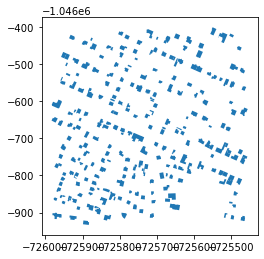

In [162]:
sample.plot()

In [168]:
tess = momepy.Tessellation(sample.reset_index(drop=True), 'uID', Point(-725718.03,-1046671.66).buffer(250, 16, 16, 3), verbose=False).tessellation
W = libpysal.weights.Queen.from_dataframe(tess)

In [169]:
tess[tess.uID == 74519]

,uID,geometry
123,74519,"POLYGON ((-725703.449 -1046681.688, -725708.31..."


In [170]:
k1 = W.neighbor_offsets[123]
k2 = []
for i in k1:
    k2 += W.neighbor_offsets[i]
k3 = []
for i in k2:
    k3 += W.neighbor_offsets[i]
neighbours = set(k1 + k2 + k3)

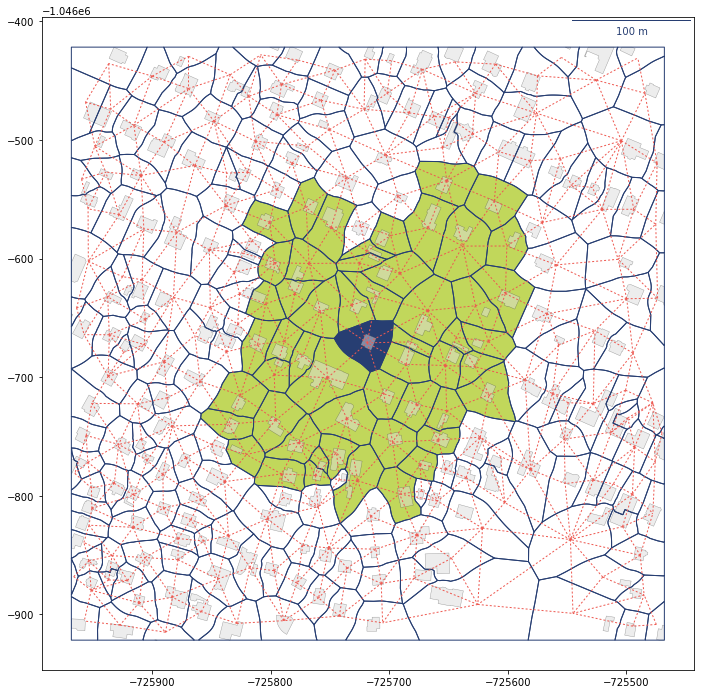

In [174]:
import numpy as np

centroids = tess.centroid.values
done = []
segments = []
for idx in W.id_order:
    if idx in W.islands:
        continue

    # Find the centroid of the polygon we're looking at now
    origin = np.array(centroids[idx].coords)[0]
    for j in W.neighbors[idx]:
        jdx = W.id2i[j]
        dest = np.array(centroids[jdx].coords)[0]
        if not hash((idx, j)) in done and not hash((j, idx)) in done:
            segments.append([origin, dest])
            done.append(hash((idx, j)))

# Plot the polygons from the geodataframe as a base layer
ax = tess.plot(figsize=(12, 12), edgecolor=c, facecolor='none', linewidth=1, zorder=1)

# # plot polygon centroids
gpd.clip(sample, Point(-725718.03,-1046671.66).buffer(250, 16, 16, 3)).plot(ax=ax, edgecolor='#333333', linewidth=.4, facecolor="#ddd", zorder=0, alpha=.5)

# plot weight edges
segs_plot = LineCollection(np.array(segments), colors=husl.husl_to_hex(14, 79, 58), linewidth=1, linestyle=(0, (2, 2)))
ax.add_collection(segs_plot)

tess.iloc[list(neighbours)].plot(ax=ax, color=husl.husl_to_hex(98, 93, 78), zorder=-2, alpha=.8)
tess.iloc[[123]].plot(ax=ax, color=husl.husl_to_hex(257, 71, 27), zorder=-1)

# add scalebar
scalebar = ScaleBar(dx=1,
                    color=c,
                    location=1,
                    height_fraction=0.001,
                    #fixed_value=1000,
#                     label=label,
#                     label_loc='bottom'
                    )
ax.add_artist(scalebar)


plt.savefig('../figs/topo_agg_2.png', dpi=300)